#2

(a)

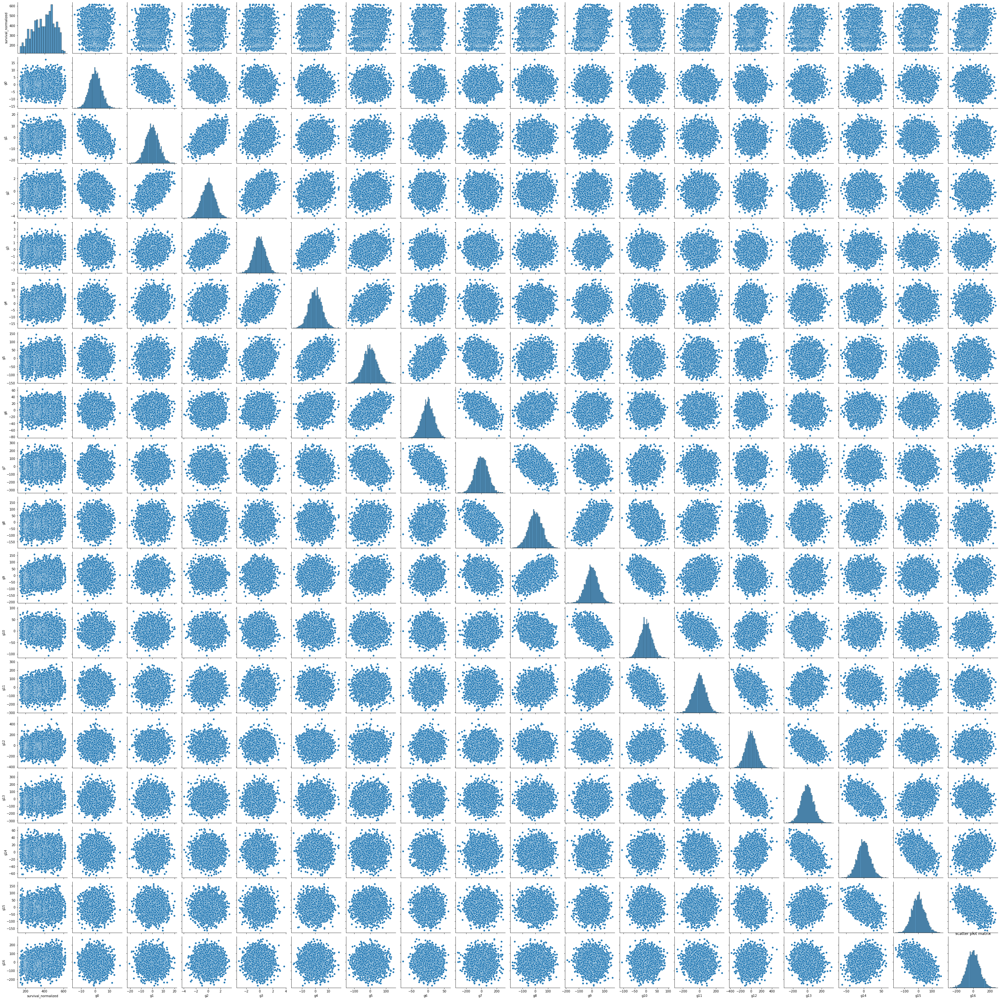

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


data = pd.read_csv('lineberger_study_data.csv')
data = data.drop(data.columns[0], axis=1)

sns.pairplot(data)
plt.title('scatter plot matrix')
plt.show()

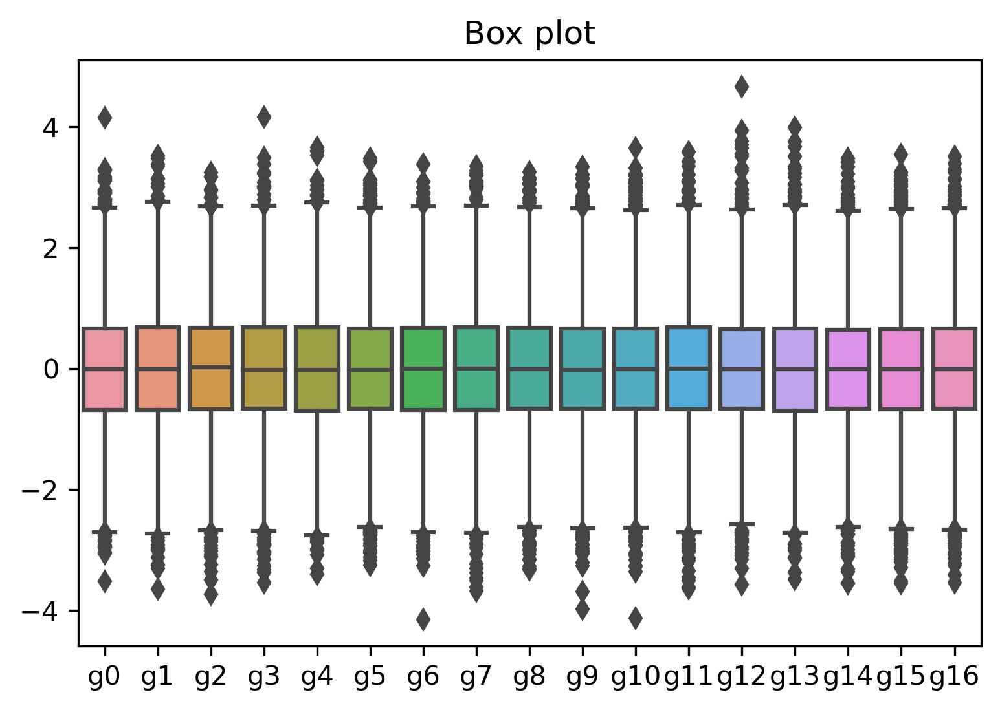

In [11]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

plt.figure(dpi=300)
sns.boxplot(data=X_scaled_df)
plt.title('Box plot')
plt.show()

we do not see any obvious outliers

In [6]:
correlation_matrix = data.corr()
correlation_with_outcome = correlation_matrix['survival_normalized'].drop('survival_normalized')
sorted_correlations = correlation_with_outcome.abs().sort_values(ascending=False)

print('predictor appear most strongly linearly correlated with the outcome:', sorted_correlations.index[0])

predictor appear most strongly linearly correlated with the outcome: g9


g9     0.262172
g16    0.237173
g5     0.209654
g8     0.209131
g11    0.205891
g13    0.205622
g4     0.144196
g1     0.128110
g12    0.126143
g10    0.115347
g2     0.114048
g7     0.113166
g6     0.089642
g3     0.083599
g15    0.054104
g14    0.053127
g0     0.029616
Name: survival_normalized, dtype: float64

(b)

In [3]:
import statsmodels.api as sm

X = data.iloc[:, 1:]
y = data.iloc[:, 0] 

X_with_intercept = sm.add_constant(X)
ols_model = sm.OLS(y, X_with_intercept)
results = ols_model.fit()

In [4]:
print("Estimated Coefficients:")
print(results.params)

print("95% Confidence Intervals:")
print(results.conf_int())

print('(unadjusted) R^2:', results.rsquared)

Estimated Coefficients:
const    392.928278
g0         3.240000
g1         3.000000
g2         5.000000
g3        -4.000000
g4         1.000000
g5         0.500000
g6         0.500000
g7         0.500000
g8         0.500000
g9         0.500000
g10        0.500000
g11        0.500000
g12        0.500000
g13        0.500000
g14        0.500000
g15        0.500000
g16        0.500000
dtype: float64
95% Confidence Intervals:
                0           1
const  390.917735  394.938821
g0       2.686342    3.793658
g1       2.544712    3.455288
g2       2.562223    7.437777
g3      -6.907164   -1.092836
g4       0.467680    1.532320
g5       0.438353    0.561647
g6       0.359767    0.640233
g7       0.469234    0.530766
g8       0.452127    0.547873
g9       0.445925    0.554075
g10      0.400408    0.599592
g11      0.465946    0.534054
g12      0.475379    0.524621
g13      0.469516    0.530484
g14      0.358985    0.641015
g15      0.443954    0.556046
g16      0.469710    0.530290
(unad

(c)

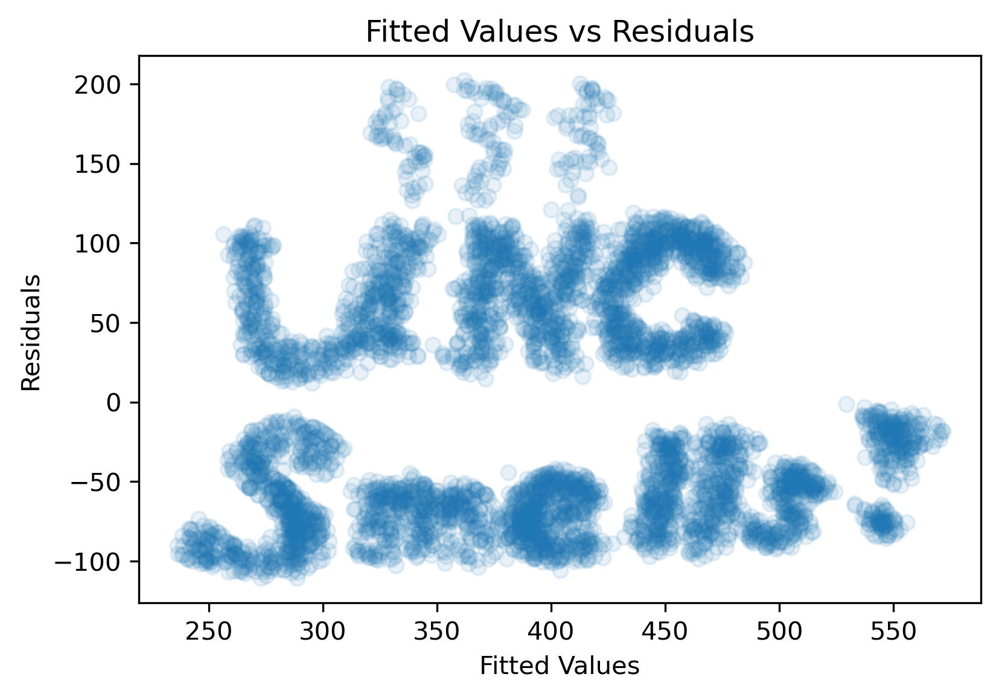

In [5]:
plt.figure(dpi=300)
plt.scatter(results.fittedvalues, results.resid,alpha=0.1)
plt.title('Fitted Values vs Residuals')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

UNC smells!